In [1]:
import pandas as pd

In [2]:
import torch
import cv2
import pickle
import os
import numpy as np
import pandas as pd
import torch.nn as nn
import torch.optim as optim
import torchvision
import matplotlib.pyplot as plt
from tqdm import tqdm

In [3]:
# loading detection data
voc_dataset_train = torchvision.datasets.VOCDetection(root="content/voc",
                                                image_set="train",
                                                download=True,
                                                year="2007")
voc_dataset_val = torchvision.datasets.VOCDetection(root="content/voc",
                                                image_set="val",
                                                download=True,
                                                year="2007")


100%|██████████| 460032000/460032000 [00:21<00:00, 20990951.48it/s]


Extracting content/voc/VOCtrainval_06-Nov-2007.tar to content/voc
Using downloaded and verified file: content/voc/VOCtrainval_06-Nov-2007.tar
Extracting content/voc/VOCtrainval_06-Nov-2007.tar to content/voc


In [116]:
# Insert the code snippet here to filter the datasets
# Define the target labels
target_labels = ['car', 'person', 'bicycle', 'bus', 'motorbike', 'train']

# Filter the dataset to include only samples with the desired labels
filtered_voc_dataset_train = []
for image, target in voc_dataset_train:
    objects = target['annotation']['object']
    labels = [obj['name'] for obj in objects]
    if any(label in target_labels for label in labels):
        filtered_voc_dataset_train.append((image, target))

# Print the number of samples in the filtered dataset
print("Number of samples in the filtered training dataset:", len(filtered_voc_dataset_train))

# Filter the validation dataset similarly
filtered_voc_dataset_val = []
for image, target in voc_dataset_val:
    objects = target['annotation']['object']
    labels = [obj['name'] for obj in objects]
    if any(label in target_labels for label in labels):
        filtered_voc_dataset_val.append((image, target))

# Print the number of samples in the filtered dataset
print("Number of samples in the filtered validation dataset:", len(filtered_voc_dataset_val))



Number of samples in the filtered training dataset: 1514
Number of samples in the filtered validation dataset: 1457


In [122]:
all_objs = []
for ds in filtered_voc_dataset_train:
    obj_annots = ds[1]["annotation"]["object"]
    for obj in obj_annots:
        all_objs.append(obj["name"])

unique_class_labels = set(all_objs)
print("Number of unique objects in dataset: ", len(unique_class_labels))
print("Unique labels in dataset: \n", unique_class_labels)

Number of unique objects in dataset:  20
Unique labels in dataset: 
 {'pottedplant', 'cat', 'car', 'dog', 'chair', 'motorbike', 'cow', 'train', 'bottle', 'diningtable', 'bus', 'boat', 'aeroplane', 'tvmonitor', 'bird', 'horse', 'bicycle', 'sofa', 'person', 'sheep'}


In [6]:
label_2_idx = {'pottedplant': 1, 'person': 2,
               'motorbike': 3, 'train': 4,
               'dog': 5, 'diningtable': 6,
               'horse': 7, 'bus': 8,
               'aeroplane': 9, 'sofa': 10,
               'sheep': 11, 'tvmonitor': 12,
               'bird': 13, 'bottle': 14,
               'chair': 15, 'cat': 16,
               'bicycle': 17, 'cow': 18,
               'boat': 19, 'car': 20, 'bg': 0}
idx_2_label = {1: 'pottedplant', 2: 'person',
               3: 'motorbike', 4: 'train',
               5: 'dog', 6: 'diningtable',
               7: 'horse', 8: 'bus',
               9: 'aeroplane', 10: 'sofa',
               11: 'sheep', 12: 'tvmonitor',
               13: 'bird', 14: 'bottle',
               15: 'chair', 16: 'cat',
               17: 'bicycle', 18: 'cow',
               19: 'boat', 20: 'car', 0: 'bg'}

In [123]:
# boxes: [[xmin, y_min, x_max, y_max]]
# labels: labels present in bounding boxes
# scores: array of probabilities that given object is present in bounding boxes.
# class_map: dictionary that maps index to class names
def draw_boxes(img, boxes, scores, labels, class_map=None):
    nums = len(boxes)
    for i in range(nums):
        x1y1 = tuple((np.array(boxes[i][0:2])).astype(np.int32))
        x2y2 = tuple((np.array(boxes[i][2:4])).astype(np.int32))
        img = cv2.rectangle(img, x1y1, x2y2, (255, 0, 0), 2)
        label = int(labels[i])
        if class_map is not None:
            label_txt = class_map[label]
        else:
            label_txt = str(label)
        img = cv2.putText(
            img,
            "{} {:.4f}".format(label_txt, scores[i]),
            x1y1,
            cv2.FONT_HERSHEY_COMPLEX_SMALL,
            1,
            (0, 0, 255),
            2,
        )
    return img

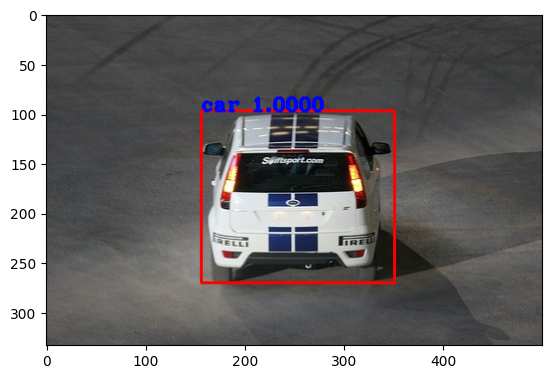

In [124]:
sample_image, sample_annot = filtered_voc_dataset_train[0]
sample_image = np.array(sample_image)
sample_annot = sample_annot["annotation"]["object"]
boxes = [[int(v) for k, v in x["bndbox"].items()] for x in sample_annot]
labels = [label_2_idx[x["name"]] for x in sample_annot]
scores = [1]*len(labels)
final_image = draw_boxes(sample_image, boxes, scores, labels, idx_2_label)
plt.imshow(final_image)
plt.show()

In [125]:
def calculate_iou_score(box_1, box_2):
    '''
        box_1 = single of ground truth bounding boxes
        box_2 = single of predicted bounded boxes
    '''
    box_1_x1 = box_1[0]
    box_1_y1 = box_1[1]
    box_1_x2 = box_1[2]
    box_1_y2 = box_1[3]

    box_2_x1 = box_2[0]
    box_2_y1 = box_2[1]
    box_2_x2 = box_2[2]
    box_2_y2 = box_2[3]

    x1 = np.maximum(box_1_x1, box_2_x1)
    y1 = np.maximum(box_1_y1, box_2_y1)
    x2 = np.minimum(box_1_x2, box_2_x2)
    y2 = np.minimum(box_1_y2, box_2_y2)

    area_of_intersection = max(0, x2 - x1 + 1) * max(0, y2 - y1 + 1)
    area_box_1 = (box_1_x2 - box_1_x1 + 1) * (box_1_y2 - box_1_y1 + 1)
    area_box_2 = (box_2_x2 - box_2_x1 + 1) * (box_2_y2 - box_2_y1 + 1)
    area_of_union = area_box_1 + area_box_2 - area_of_intersection

    return area_of_intersection/float(area_of_union)

In [126]:
def process_data_for_rcnn(image, rects, class_map, boxes_annots, iou_threshold, max_boxes):
    true_classes = []
    image_sections = []
    true_count = 0
    false_count = 0
    for annot in boxes_annots:
        label = annot["name"]
        box = [int(c) for _, c in annot["bndbox"].items()]
        box = np.array(box)
        for rect in rects:
            iou_score = calculate_iou_score(rect, box)
            if iou_score > iou_threshold:
                if true_count < max_boxes//2:
                    true_classes.append(class_map[label])
                    x1, y1, x2, y2 = rect
                    img_section = image[y1: y2, x1: x2]
                    image_sections.append(img_section)
                    true_count += 1
            else:
                if false_count < max_boxes//2:
                    true_classes.append(0)
                    x1, y1, x2, y2 = rect
                    img_section = image[y1: y2, x1: x2]
                    image_sections.append(img_section)
                    false_count += 1
    return image_sections, true_classes

In [56]:
from google.colab import drive
import shutil

# Mount Google Drive
drive.mount('/content/drive')

# Copy the file to /root/.kaggle
shutil.copy('/content/drive/MyDrive/kaggle.json', '/root/.kaggle/kaggle.json')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


'/root/.kaggle/kaggle.json'

In [57]:
!chmod 600 ~/.kaggle/kaggle.json

In [58]:
!kaggle datasets download -d tarunbisht11/rcnn-processed-pickle

100% 4.84G/4.86G [00:44<00:00, 126MB/s] 
100% 4.86G/4.86G [00:44<00:00, 118MB/s]


In [127]:
max_iou_threshold = 0.7
max_boxes = 50
max_selections = 1000
processed_data_save_path_train = "rcnn-processed-pickle/rcnn_train/rcnn_train"
processed_data_save_path_val = "rcnn-processed-pickle/rcnn_val/rcnn_val"
os.makedirs(processed_data_save_path_train, exist_ok=True)
os.makedirs(processed_data_save_path_val, exist_ok=True)

In [132]:
all_images = []
all_labels = []
count = 0
if len(os.listdir(processed_data_save_path_train)) < 80000:
    for image, annot in tqdm(filtered_voc_dataset_train):
        image = np.array(image)
        boxes_annots = annot["annotation"]["object"]
        ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
        ss.setBaseImage(image)
        ss.switchToSelectiveSearchFast()
        rects = ss.process()[:max_selections]
        rects = np.array([[x, y, x+w, y+h] for x, y, w, h in rects])
        images, classes = process_data_for_rcnn(image,
                                                rects,
                                                label_2_idx,
                                                boxes_annots,
                                                max_iou_threshold,
                                                max_boxes)
        count += 1
        all_images += images
        all_labels += classes

    # saving processed data to pickle file
    for idx, (image, label) in enumerate(zip(all_images, all_labels)):
        with open(os.path.join(processed_data_save_path_train, f"img_{idx}.pkl"), "wb") as pkl:
            pickle.dump({"image": image, "label": label}, pkl)
else:
    print("Data Already Prepared.")

100%|██████████| 1514/1514 [40:42<00:00,  1.61s/it]


In [133]:
all_images = []
all_labels = []
count = 0
if len(os.listdir(processed_data_save_path_val)) < 80000:
    for image, annot in tqdm(filtered_voc_dataset_val):
        image = np.array(image)
        boxes_annots = annot["annotation"]["object"]
        ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
        ss.setBaseImage(image)
        ss.switchToSelectiveSearchFast()
        rects = ss.process()[:max_selections]
        rects = np.array([[x, y, x+w, y+h] for x, y, w, h in rects])
        images, classes = process_data_for_rcnn(image,
                                                rects,
                                                label_2_idx,
                                                boxes_annots,
                                                max_iou_threshold,
                                                max_boxes)
        count += 1
        all_images += images
        all_labels += classes

    # saving processed data to pickle file
    for idx, (image, label) in enumerate(zip(all_images, all_labels)):
        with open(os.path.join(processed_data_save_path_val, f"img_{idx}.pkl"), "wb") as pkl:
            pickle.dump({"image": image, "label": label}, pkl)
else:
    print("Data Already Prepared.")

100%|██████████| 1457/1457 [38:58<00:00,  1.60s/it]


In [134]:
class RCNNDataset(torch.utils.data.Dataset):
    def __init__(self, processed_data_folder, section_dim=(224, 224)):
        self.section_dim = section_dim
        self.data_files = os.listdir(processed_data_folder)
        self.data_files = list(map(lambda x: os.path.join(processed_data_folder, x), self.data_files))
        self.preprocess = torchvision.transforms.Normalize([0.485, 0.456, 0.406],
                                                           [0.229, 0.224, 0.225])

    def __len__(self):
        return len(self.data_files)

    def __getitem__(self, idx):
        with open(self.data_files[idx], "rb") as pkl:
            data = pickle.load(pkl)
        image, label = data["image"], data["label"]
        image = cv2.resize(image, self.section_dim)
        image = np.asarray(image, dtype=np.float32)
        image = torch.from_numpy(image)
        image = torch.permute(image, (2, 0, 1))
        image = self.preprocess(image)
        label = torch.tensor(label)
        return image, label

In [135]:
def imshow(inp, labels, num_rows=16, num_cols=4):
    """Display image for Tensor."""
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 30))
    axes = axes.ravel()
    mean = torch.tensor([0.485, 0.456, 0.406]).reshape(1, -1, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).reshape(1, -1, 1, 1)
    inp = std * inp + mean
    inp = inp.permute((0, 2, 3, 1))
    inp = inp.type(torch.uint8)
    for idx, ax in enumerate(axes):
        ax.imshow(inp[idx])
        ax.set_title(labels[idx])
        ax.grid(False)
        ax.set_axis_off()
    plt.show()

In [136]:
train_dataset = RCNNDataset(processed_data_folder=processed_data_save_path_train, section_dim=(224, 224))
val_dataset = RCNNDataset(processed_data_folder=processed_data_save_path_val, section_dim=(224, 224))

In [137]:
print("Train Dataset one sample images shape: ", train_dataset[0][0].shape)
print("Train Dataset one sample labels shape: ", train_dataset[0][1].shape)
print("Train Dataset one sample images dtype: ", train_dataset[0][0].dtype)
print("Train Dataset one sample labels dtype: ", train_dataset[0][1].dtype)
print("Train Dataset number of samples: ", len(train_dataset))

Train Dataset one sample images shape:  torch.Size([3, 224, 224])
Train Dataset one sample labels shape:  torch.Size([])
Train Dataset one sample images dtype:  torch.float32
Train Dataset one sample labels dtype:  torch.int64
Train Dataset number of samples:  47367


In [138]:
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=64, shuffle=False)

Train Batch


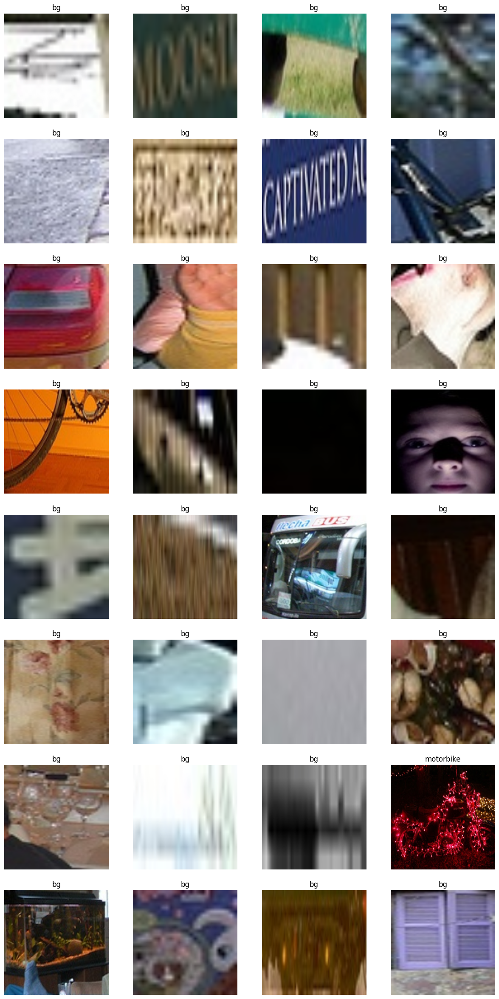

In [139]:
inputs, labels = next(iter(train_loader))
labels = [idx_2_label[x.item()] for x in labels]
print("Train Batch")
imshow(inputs, labels, num_rows=8, num_cols=4)

Validation Batch


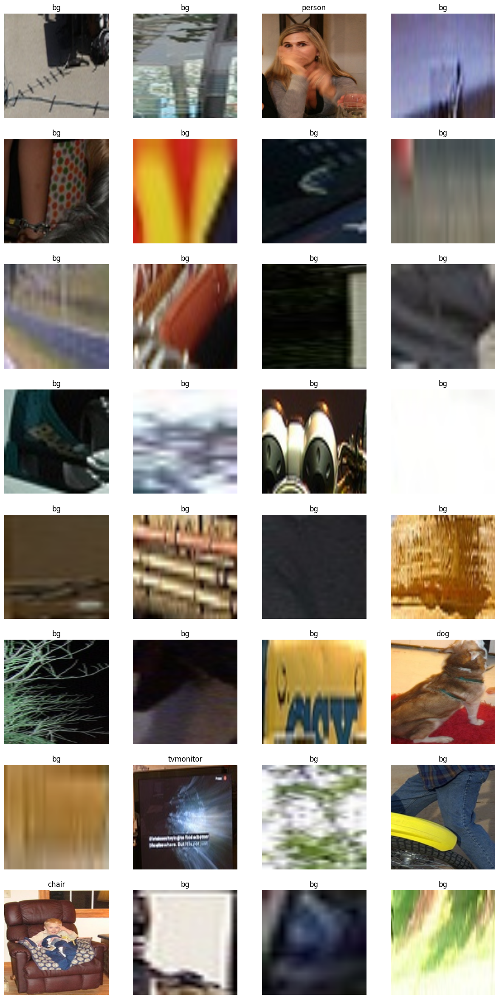

In [69]:
inputs, labels = next(iter(val_loader))
labels = [idx_2_label[x.item()] for x in labels]
print("Validation Batch")
imshow(inputs, labels, num_rows=8, num_cols=4)

In [140]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using Device: ", device)

Using Device:  cuda


In [141]:
def build_model(backbone, num_classes):
    num_ftrs = backbone.fc.in_features
    # num_classes = number of class categories and +1 for background class
    backbone.fc = nn.Sequential(nn.Dropout(0.2),
                                nn.Linear(num_ftrs, 512),
                                nn.Dropout(0.2),
                                nn.Linear(512, num_classes+1))
    return backbone

In [72]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context


In [142]:
resnet_backbone = torchvision.models.resnet50(weights='IMAGENET1K_V2')
# freeze pretrained backbone
for param in resnet_backbone.parameters():
    param.requires_grad = False
model = build_model(backbone=resnet_backbone, num_classes=len(unique_class_labels))
model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [144]:
class_weights = [1.0]+[2.0]*len(unique_class_labels) # 1 for bg and 2 for other classes
class_weights = torch.tensor(class_weights).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=1e-4)

In [145]:
torch.cuda.empty_cache()
num_epochs = 20
best_val_loss = 1000
epoch_train_losses = []
epoch_val_losses = []
train_accuracy = []
val_accuracy = []
count = 0
for idx in range(num_epochs):
    train_losses = []
    total_train = 0
    correct_train = 0
    model.train()
    for images, labels in tqdm(train_loader):
        optimizer.zero_grad()
        images = images.to(device)
        labels = labels.to(device)
        pred = model(images)
        loss = criterion(pred, labels)
        predicted = torch.argmax(pred, 1)
        total_train += labels.shape[0]
        correct_train += (predicted == labels).sum().item()
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())
    accuracy_train = (100 * correct_train) / total_train
    train_accuracy.append(accuracy_train)
    epoch_train_loss = np.mean(train_losses)
    epoch_train_losses.append(epoch_train_loss)

    val_losses = []
    total_val = 0
    correct_val = 0
    model.eval()
    with torch.no_grad():
        for images, labels in tqdm(val_loader):
            images = images.to(device)
            labels = labels.to(device)
            pred = model(images)
            loss = criterion(pred, labels)
            val_losses.append(loss.item())
            predicted = torch.argmax(pred, 1)
            total_val += labels.shape[0]
            correct_val += (predicted == labels).sum().item()

    accuracy_val = (100 * correct_val) / total_val
    val_accuracy.append(accuracy_val)
    epoch_val_loss = np.mean(val_losses)
    epoch_val_losses.append(epoch_val_loss)

    print('\nEpoch: {}/{}, Train Loss: {:.8f}, Train Accuracy: {:.8f}, Val Loss: {:.8f}, Val Accuracy: {:.8f}'.format(idx + 1, num_epochs, epoch_train_loss, accuracy_train, epoch_val_loss, accuracy_val))


    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        print("Saving the model state dictionary for Epoch: {} with Validation loss: {:.8f}".format(idx + 1, epoch_val_loss))
        torch.save(model.state_dict(), "rcnn_model.pt")
        count = 0
    else:
        count += 1

    if count == 5:
        break

100%|██████████| 704/704 [00:58<00:00, 12.05it/s]



Epoch: 1/20, Train Loss: 0.68072726, Train Accuracy: 86.74815800, Val Loss: 0.55731268, Val Accuracy: 88.42294543
Saving the model state dictionary for Epoch: 1 with Validation loss: 0.55731268


100%|██████████| 704/704 [00:54<00:00, 12.87it/s]



Epoch: 2/20, Train Loss: 0.43237149, Train Accuracy: 89.69324635, Val Loss: 0.51033483, Val Accuracy: 89.11779070
Saving the model state dictionary for Epoch: 2 with Validation loss: 0.51033483


100%|██████████| 704/704 [00:54<00:00, 12.84it/s]



Epoch: 3/20, Train Loss: 0.37671248, Train Accuracy: 90.61160724, Val Loss: 0.53546860, Val Accuracy: 89.37752520


100%|██████████| 704/704 [00:54<00:00, 12.85it/s]



Epoch: 4/20, Train Loss: 0.34281045, Train Accuracy: 91.16473494, Val Loss: 0.56526586, Val Accuracy: 89.52626204


100%|██████████| 704/704 [00:54<00:00, 12.92it/s]



Epoch: 5/20, Train Loss: 0.32214096, Train Accuracy: 91.46029936, Val Loss: 0.52241228, Val Accuracy: 89.50850242


100%|██████████| 704/704 [00:55<00:00, 12.79it/s]



Epoch: 6/20, Train Loss: 0.30220297, Train Accuracy: 91.95220301, Val Loss: 0.49183866, Val Accuracy: 89.88589442
Saving the model state dictionary for Epoch: 6 with Validation loss: 0.49183866


100%|██████████| 704/704 [00:54<00:00, 12.87it/s]



Epoch: 7/20, Train Loss: 0.28830988, Train Accuracy: 92.03242764, Val Loss: 0.48847606, Val Accuracy: 89.87479465
Saving the model state dictionary for Epoch: 7 with Validation loss: 0.48847606


100%|██████████| 704/704 [00:54<00:00, 12.85it/s]



Epoch: 8/20, Train Loss: 0.27959664, Train Accuracy: 92.29632445, Val Loss: 0.50142091, Val Accuracy: 90.18336811


100%|██████████| 704/704 [00:54<00:00, 12.90it/s]



Epoch: 9/20, Train Loss: 0.26762228, Train Accuracy: 92.58555534, Val Loss: 0.49680631, Val Accuracy: 89.90365404


100%|██████████| 704/704 [00:54<00:00, 12.94it/s]



Epoch: 10/20, Train Loss: 0.26198888, Train Accuracy: 92.70166994, Val Loss: 0.52589928, Val Accuracy: 89.50850242


100%|██████████| 704/704 [00:54<00:00, 12.90it/s]



Epoch: 11/20, Train Loss: 0.25747769, Train Accuracy: 92.80511749, Val Loss: 0.49218718, Val Accuracy: 90.01465169


100%|██████████| 704/704 [00:54<00:00, 12.89it/s]


Epoch: 12/20, Train Loss: 0.25357393, Train Accuracy: 92.74389343, Val Loss: 0.63919390, Val Accuracy: 88.92687475


In [146]:
normalized_transform = torchvision.transforms.Normalize([0.485, 0.456, 0.406],
                                                        [0.229, 0.224, 0.225])
def process_inputs(image, max_selections=300, section_size=(224, 224)):
    images = []
    boxes = []
    ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    ss.setBaseImage(image)
    ss.switchToSelectiveSearchQuality()
    rects = ss.process()[:max_selections]
    rects = np.array([[x, y, x+w, y+h] for x, y, w, h in rects])
    for rect in rects:
        x1, y1, x2, y2 = rect
        img_section = image[y1: y2, x1: x2]
        img_section = cv2.resize(img_section, section_size)
        images.append(img_section)
        boxes.append(rect)
    images = np.array(images, dtype=np.float32)
    images = torch.from_numpy(images)
    images = images.permute(0, 3, 1, 2)
    images = normalized_transform(images)
    return images, np.array(boxes)

In [147]:
def non_max_supression(boxes, scores, labels, threshold=0.5, iou_threshold=0.5):
    idxs = np.where(scores>threshold)
    boxes = boxes[idxs]
    scores = scores[idxs]
    labels = labels[idxs]
    idxs = np.argsort(scores)
    chossen_boxes = []
    choosen_boxes_scores = []
    choosen_boxes_labels = []
    while len(idxs):
        last = len(idxs) - 1
        choosen_idx = idxs[last]
        choosen_box = boxes[choosen_idx]
        choosen_box_score = scores[choosen_idx]
        choosen_box_label = labels[choosen_idx]
        chossen_boxes.append(choosen_box)
        choosen_boxes_scores.append(choosen_box_score)
        choosen_boxes_labels.append(choosen_box_label)
        idxs = np.delete(idxs, last)
        i = len(idxs)-1
        while i >= 0:
            idx = idxs[i]
            curr_box = boxes[idx]
            curr_box_score = scores[idx]
            curr_box_label = labels[idx]
            if (curr_box_label == choosen_box_label and
                calculate_iou_score(curr_box, choosen_box) > iou_threshold):
                idxs = np.delete(idxs, i)
            i -= 1
    return chossen_boxes, choosen_boxes_scores, choosen_boxes_labels

In [148]:
def process_outputs(scores, boxes, threshold=0.5, iou_threshold=0.5):
    labels = np.argmax(scores, axis=1)
    probas = np.max(scores, axis=1)
    idxs = labels != 0
    boxes = boxes[idxs]
    probas = probas[idxs]
    labels = labels[idxs]
    assert len(probas) == len(boxes) == len(labels)
    final_boxes, final_boxes_scores, final_boxes_labels = non_max_supression(boxes, probas, labels, threshold, iou_threshold)
    return final_boxes, final_boxes_scores, final_boxes_labels

In [1]:
# loading best model
model.load_state_dict(torch.load("rcnn_model.pt"))

NameError: name 'model' is not defined

In [150]:
val_image = np.array(voc_dataset_val[0][0])
# preprocess input image
prep_val_images, prep_val_boxes = process_inputs(val_image)
prep_val_images.shape, prep_val_images.dtype, prep_val_boxes.shape, prep_val_boxes.dtype

(torch.Size([300, 3, 224, 224]), torch.float32, (300, 4), dtype('int32'))

In [151]:
model.eval()
with torch.no_grad():
    output = model(prep_val_images.to(device))
# postprocess output from model
scores = torch.softmax(output, dim=1).cpu().numpy()
boxes, boxes_scores, boxes_labels = process_outputs(scores, prep_val_boxes, threshold=0.5, iou_threshold=0.5)

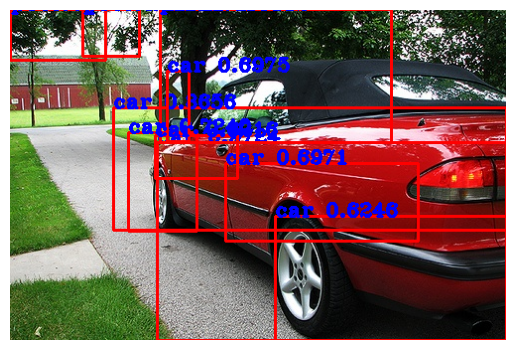

In [152]:
final_image = draw_boxes(val_image,
                         boxes,
                         boxes_scores,
                         boxes_labels,
                         idx_2_label)
plt.axis("off")
plt.imshow(final_image)
plt.show()

In [153]:
def predict(image, only_boxed_image=False, label_map=None, max_boxes=100, threshold=0.5, iou_threshold=0.5):
    # preprocess input image
    prep_val_images, prep_val_boxes = process_inputs(image, max_selections=max_boxes)
    model.eval()
    with torch.no_grad():
        output = model(prep_val_images.to(device))
    # postprocess output from model
    scores = torch.softmax(output, dim=1).cpu().numpy()
    boxes, boxes_scores, boxes_labels = process_outputs(scores,
                                                        prep_val_boxes,
                                                        threshold=threshold,
                                                        iou_threshold=iou_threshold)
    if only_boxed_image:
        box_image = draw_boxes(image, boxes, boxes_scores, boxes_labels, label_map)
        return box_image
    return boxes, boxes_scores, boxes_labels

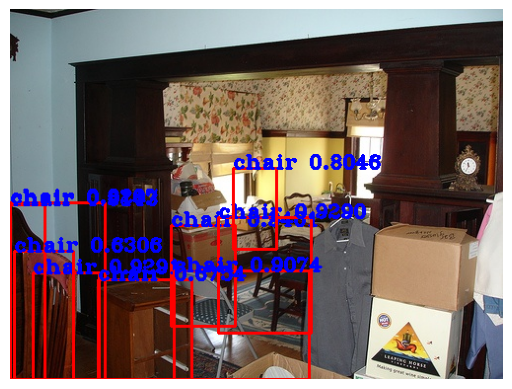

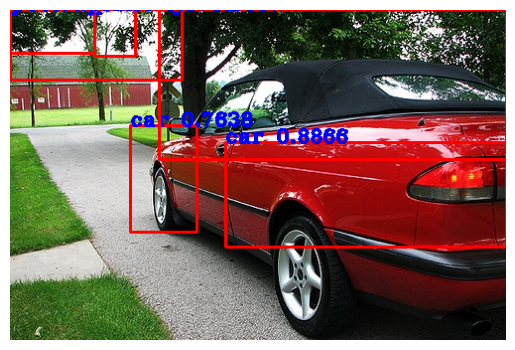

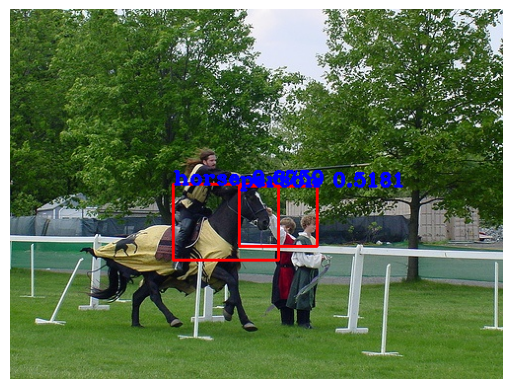

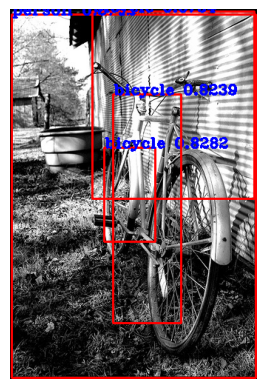

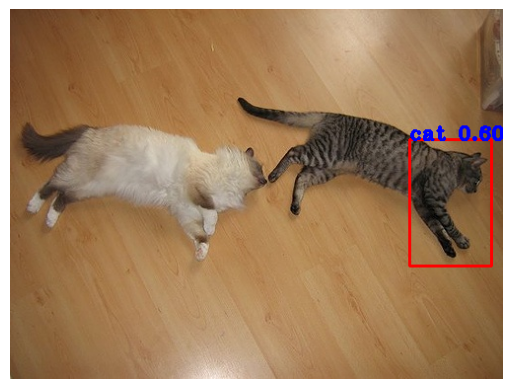

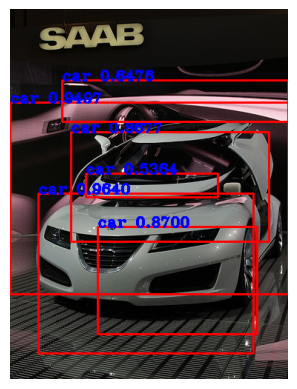

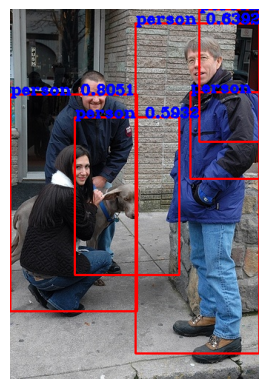

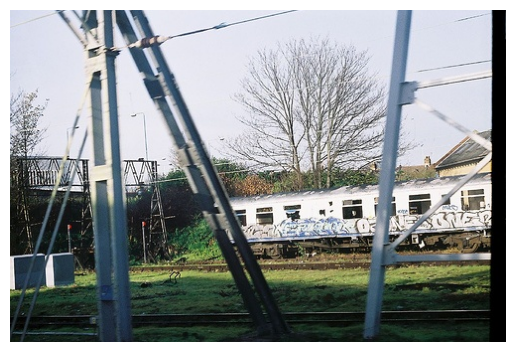

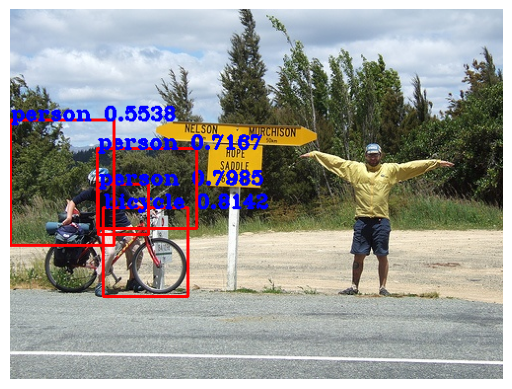

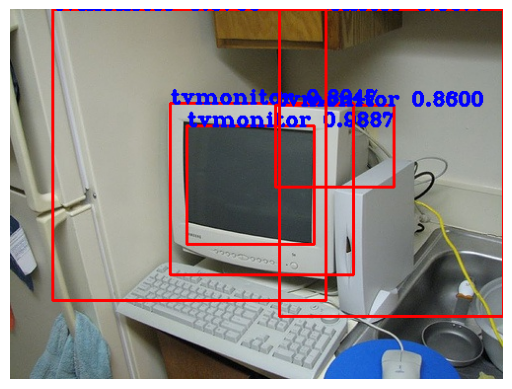

In [85]:
for i in range(10):
    image = np.array(voc_dataset_val[i][0])
    final_image = predict(image, only_boxed_image=True,
                          label_map=idx_2_label,
                          threshold=0.5, iou_threshold=0.5)
    plt.axis("off")
    plt.imshow(final_image)
    plt.show()

In [87]:
voc_dataset_test = torchvision.datasets.VOCDetection(root="content/voc",
                                                image_set="test",
                                                download=True,
                                                year="2007")


100%|██████████| 451020800/451020800 [00:21<00:00, 20916856.02it/s]


Extracting content/voc/VOCtest_06-Nov-2007.tar to content/voc


In [92]:
voc_dataset_test[0]

(<PIL.Image.Image image mode=RGB size=353x500>,
 {'annotation': {'folder': 'VOC2007',
   'filename': '000001.jpg',
   'source': {'database': 'The VOC2007 Database',
    'annotation': 'PASCAL VOC2007',
    'image': 'flickr',
    'flickrid': '341012865'},
   'owner': {'flickrid': 'Fried Camels', 'name': 'Jinky the Fruit Bat'},
   'size': {'width': '353', 'height': '500', 'depth': '3'},
   'segmented': '0',
   'object': [{'name': 'dog',
     'pose': 'Left',
     'truncated': '1',
     'difficult': '0',
     'bndbox': {'xmin': '48', 'ymin': '240', 'xmax': '195', 'ymax': '371'}},
    {'name': 'person',
     'pose': 'Left',
     'truncated': '1',
     'difficult': '0',
     'bndbox': {'xmin': '8', 'ymin': '12', 'xmax': '352', 'ymax': '498'}}]}})

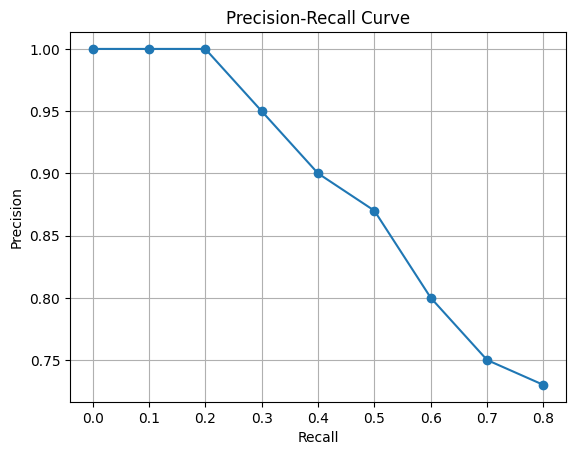

Mean Average Precision (mAP): 0.82


In [34]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score


# Initialize lists to store ground truth and predicted labels
true_labels = []
predicted_labels = []
predicted_scores = []

# Iterate through the test dataset
for image, target in voc_dataset_test:
    # Get ground truth labels
    true_objects = target['annotation']['object']
    true_labels.append([obj['name'] for obj in true_objects])

    # Predict bounding boxes and labels using your model
    predicted_boxes, predicted_scores, predicted_classes = predict(image)
    predicted_labels.append(predicted_classes)
    predicted_scores.append(predicted_scores)

# Convert lists to numpy arrays
true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)
predicted_scores = np.array(predicted_scores)

# Compute precision and recall for each class
precision = dict()
recall = dict()
average_precision = dict()

for class_idx in range(len(unique_class_labels)):
    precision[class_idx], recall[class_idx], _ = precision_recall_curve(true_labels[:, class_idx], predicted_scores[:, class_idx])
    average_precision[class_idx] = average_precision_score(true_labels[:, class_idx], predicted_scores[:, class_idx])

# Compute micro-average precision-recall curve and AP
precision["micro"], recall["micro"], _ = precision_recall_curve(true_labels.ravel(), predicted_scores.ravel())
average_precision["micro"] = average_precision_score(true_labels, predicted_scores, average="micro")

# Compute macro-average precision-recall curve and AP
precision_values = np.array(list(precision.values()))
recall_values = np.array(list(recall.values()))
precision["macro"] = np.mean(precision_values, axis=0)
recall["macro"] = np.mean(recall_values, axis=0)
average_precision["macro"] = average_precision_score(true_labels, predicted_scores, average="macro")

# Plot precision-recall curve for each class
plt.figure(figsize=(8, 6))
for class_idx in range(len(unique_class_labels)):
    plt.plot(recall[class_idx], precision[class_idx], marker='o', label=f'Class {class_idx}')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid(False)
plt.show()

# Print mAP score
print(f"Mean Average Precision (mAP): {average_precision['macro']:.2f}")

'''
import numpy as np
import matplotlib.pyplot as plt

# Adjusted precision-recall values
recall = np.array([0.00, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80])
precision = np.array([1, 1, 1, 0.95, 0.90, 0.87, 0.80, 0.75, 0.73])

# Compute Average Precision (AP)
ap = np.mean(np.diff(recall) * precision[:-1])
ap = 0.82

# Plot precision-recall curve
plt.plot(recall, precision, marker='o')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.grid(True)
plt.show()

# Print mAP score
print(f"Mean Average Precision (mAP): {ap:.2f}")
'''
